In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 500
plt.rcParams['text.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'k'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.edgecolor'] = 'w'
plt.rcParams['figure.facecolor'] = 'k'
plt.rcParams['axes.facecolor'] = 'k'
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors
from astropy.visualization import SqrtStretch, LinearStretch, LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import pandas as pd
import re
from astropy.io import fits
import os
from scipy.ndimage import map_coordinates
from scipy.stats import binned_statistic
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from pathlib import Path
from scipy.stats import gaussian_kde
import seaborn as sns

from matplotlib.lines import Line2D
os.chdir("/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling")

In [2]:
# Define the lens corresponding parameters (order preserved)
# POW
pow_params = ['$z_{s,fid}$', 'x', 'y', 'e', '$θ_{e}$', '$r_{Ein}$', '$\gamma$ (PWI)']

# SIE
sie_params = ['$\sigma$', 'x', 'y', 'e', '$θ_{e}$', '$r_{core}$', 'NaN']

# NFW
nfw_params = ['M', 'x', 'y', 'e', '$θ_{e}$', 'c or $r_{s}$', 'NaN']

# EIN
ein_params = ['M', 'x', 'y', 'e', '$θ_{e}$', 'c or $r_{s}$', r'$\alpha_{e}$']

# SHEAR 
shear_params = ['$z_{s,fid}$', 'x', 'y', '$\gamma$', '$θ_{\gamma}$', 'NaN', '$\kappa$']

# Sersic
sersic_params = ['$M_{tot}$', 'x', 'y', 'e', '$θ_{e}$', '$r_{e}$', '$n$']

# Cored SIE
cored_sie_params = ['M', 'x', 'y', 'e', '$θ_{e}$', '$r_{core}$', 'NaN']

# Multipoles
mpole_params = ['$z_{s,fid}$', 'x', 'y', '$\epsilon$', '$θ_{m}$', 'm', 'n']

model_list = ['POW', 'SIE', 'ANFW', 'EIN', 'PERT', 'SERS', 'MPOLE']
model_params = {
    'POW': pow_params,
    'SIE': sie_params,
    'ANFW': nfw_params,
    'EIN': ein_params,
    'PERT': shear_params,
    'SERS': sersic_params,
    'MPOLE' : mpole_params
}


In [3]:
# Define function to make both tables
def rms_extract(model_ver, model_path, constraint):
    global pos_rms, mag_rms
    # Load the data
    with open(model_path + '/' + model_ver + '_optresult' + '.dat', 'r') as file:
        opt_result = file.readlines()

    # Find the last line with 'optimize' in it
    last_optimize_index = None
    for idx in range(len(opt_result) - 1, -1, -1):
        if 'optimize' in opt_result[idx]:
            last_optimize_index = idx
            last_optimize_line = opt_result[idx]
            break
    if last_optimize_index is None:
        raise ValueError("No line with 'optimize' found in the file.")

    # Extract everything after the last 'optimize' line
    opt_result = opt_result[last_optimize_index + 1:]

    # Count the number of lines that start with 'lens'
    lens_count = sum(1 for line in opt_result if line.startswith('lens'))

    # Initialize a dictionary to hold the lens parameters
    lens_params_dict = {}

    # Extract the lens parameters
    lens_params = []
    for line in opt_result:
        if line.startswith('lens'):
            parts = re.split(r'\s+', line.strip())
            lens_name = parts[1]
            params = [float(x) for x in parts[2:]]

            # Store the parameters in the dictionary
            lens_params_dict[lens_name] = params
            lens_params.append((lens_name, params))

    # Remove the first lens parameter
    if lens_params:
        for i in range(len(lens_params)):
            lens_name, params = lens_params[i]
            lens_params_dict[lens_name] = params[1:]

    # Number of len profiles
    num_lens_profiles = len(lens_params_dict)

    # Use generic column names: param1, param2, ...
    df = pd.DataFrame()
    rows = []
    max_param_len = 0

    for lens_name, params in lens_params_dict.items():
        row = {'Lens Name': lens_name}
        for i, val in enumerate(params):
            row[f'param{i+1}'] = val
        rows.append(row)
        if len(params) > max_param_len:
            max_param_len = len(params)

    columns = ['Lens Name'] + [f'param{i+1}' for i in range(max_param_len)]
    df = pd.DataFrame(rows, columns=columns)
    
    # Load the input parameters from the Python file
    with open('Test/POS+MAG/SIE+SHEAR/pos_point.py', 'r') as file:
        py = file.readlines()

    # Extracting the input parameters from the Python file
    set_lens_lines = [line for line in py if line.startswith('glafic.set_lens(')]
    if not set_lens_lines:
        raise ValueError("No lines starting with 'glafic.set_lens(' found in the file.")

    set_lens_params = []
    for line in set_lens_lines:
        match = re.search(r'set_lens\((.*?)\)', line)
        if match:
            params_str = match.group(1)
            params = [param.strip() for param in params_str.split(',')]
            set_lens_params.append(params)
        else:
            raise ValueError(f"No valid parameters found in line: {line.strip()}")

    # Store the parameters in a dictionary
    set_lens_dict = {}
    for params in set_lens_params:
        if len(params) < 3:
            raise ValueError(f"Not enough parameters found in line: {params}")
        lens_name = params[1].strip("'\"")  # Remove quotes from lens name
        lens_params = [float(x) for x in params[2:]]  # Skip index and lens name
        set_lens_dict[lens_name] = lens_params

    # Remove the first lens parameter
    if set_lens_dict:
        for lens_name, params in set_lens_dict.items():
            set_lens_dict[lens_name] = params[1:]  # Remove the first parameter (index)

    # Use generic column names: param1, param2, ...
    df_input = pd.DataFrame()
    rows_input = []
    max_param_len_input = 0
    for lens_name, params in set_lens_dict.items():
        row = {'Lens Name': lens_name}
        for i, val in enumerate(params):
            row[f'param{i+1}'] = val
        rows_input.append(row)
        if len(params) > max_param_len_input:
            max_param_len_input = len(params)
    columns_input = ['Lens Name'] + [f'param{i+1}' for i in range(max_param_len_input)]
    df_input = pd.DataFrame(rows_input, columns=columns_input)
    
    # Extract input flags from the Python file
    set_flag_lines = [line for line in py if line.startswith('glafic.setopt_lens(')]
    if not set_flag_lines:
        raise ValueError("No lines starting with 'glafic.setopt_lens(' found in the file.")
    set_flag_params = []
    for line in set_flag_lines:
        match = re.search(r'setopt_lens\((.*?)\)', line)
        if match:
            params_str = match.group(1)
            params = [param.strip() for param in params_str.split(',')]
            set_flag_params.append(params)
        else:
            raise ValueError(f"No valid parameters found in line: {line.strip()}")
    
    # Store the parameters in a dictionary
    set_flag_dict = {}
    for params in set_flag_params:
        if len(params) < 2:
            raise ValueError(f"Not enough parameters found in line: {params}")
        # The lens name is not present in setopt_lens, so use the lens index to map to set_lens_dict
        lens_index = params[0].strip("'\"")
        # Find the lens name corresponding to this index from set_lens_params
        lens_name = None
        for lens_params in set_lens_params:
            if lens_params[0].strip("'\"") == lens_index:
                lens_name = lens_params[1].strip("'\"")
                break
        if lens_name is None:
            raise ValueError(f"Lens name for index {lens_index} not found in set_lens_params")
        flag = ','.join(params[1:])  # Join all flag values as a string
        set_flag_dict[lens_name] = flag
   
    # Remove the first flag parameter
    if set_flag_dict:
        for lens_name, flag in set_flag_dict.items():
            flag_parts = flag.split(',')
            set_flag_dict[lens_name] = ','.join(flag_parts[1:])  # Remove the first flag parameter
    
    # Dynamically create columns: 'Lens Name', 'flag1', 'flag2', ..., based on the maximum number of flags
    df_flag = pd.DataFrame()
    rows_flag = []
    max_flag_len = 0
    
    # First, determine the maximum number of flags
    for flag in set_flag_dict.values():
        flag_parts = flag.split(',')
        if len(flag_parts) > max_flag_len:
            max_flag_len = len(flag_parts)
    for lens_name, flag in set_flag_dict.items():
        flag_parts = flag.split(',')
        row = {'Lens Name': lens_name}
        for i, val in enumerate(flag_parts):
            row[f'flag{i+1}'] = val
        rows_flag.append(row)
    columns_flag = ['Lens Name'] + [f'flag{i+1}' for i in range(max_flag_len)]  
    df_flag = pd.DataFrame(rows_flag, columns=columns_flag)
    
    # Combine all dataframes into a list of dataframes for each lens
    dfs = []
    
    for i in range(num_lens_profiles):
        lens_name = df['Lens Name'][i]
        
        # Find the model type (case-insensitive match)
        model_type = None
        for m in model_list:
            if m.lower() == lens_name.lower():
                model_type = m
                break
        if model_type is None:
            continue

        symbols = model_params[model_type][:7]
        # Row 2: input
        row_input = pd.DataFrame([df_input.iloc[i, 1:8].values], columns=symbols)
        # Row 3: output
        row_output = pd.DataFrame([df.iloc[i, 1:8].values], columns=symbols)
        # Row 4: flags
        row_flags = pd.DataFrame([df_flag.iloc[i, 1:8].values], columns=symbols)

        # Stack vertically, add a label column for row type
        lens_df = pd.concat([
            row_input.assign(Type='Input'),
            row_output.assign(Type='Output'),
            row_flags.assign(Type='Flag')
        ], ignore_index=True)
        lens_df.insert(0, 'Lens Name', lens_name)
        
        # Move 'Type' to the second column
        cols = lens_df.columns.tolist()
        cols.insert(1, cols.pop(cols.index('Type')))
        lens_df = lens_df[cols]
        dfs.append(lens_df)
    
    # Anomaly Calculation
    columnn_names = ['x', 'y', 'mag', 'pos_err', 'mag_err', '1', '2', '3']
    obs_point = pd.read_csv('obs_point/obs_point_(POS+FLUX).dat', delim_whitespace=True, header=None, skiprows=1, names=columnn_names)
    out_point = pd.read_csv(model_path + '/' + model_ver + '_point.dat', delim_whitespace=True, header=None, skiprows=1, names=columnn_names)
    out_point.drop(columns=['mag_err', '1', '2', '3'], inplace=True)

    # Drop rows in obs_point where the corresponding out_point['mag'] < 1
    mask = abs(out_point['mag']) >= 1
    out_point = out_point[mask[:len(out_point)]].reset_index(drop=True)
    out_point['x_diff'] = abs(out_point['x'] - obs_point['x'])
    out_point['y_diff'] = abs(out_point['y'] - obs_point['y'])
    out_point['mag_diff'] = abs(abs(out_point['mag']) - abs(obs_point['mag']))
    out_point['pos_sq'] = np.sqrt((out_point['x_diff']**2 + out_point['y_diff']**2).astype(float))  # Plotted on graph

    # RMS
    pos_rms = np.average(out_point['pos_sq'])

    mag_rms = np.average(np.sqrt((out_point['mag_diff']**2).astype(float)))

    return pos_rms, mag_rms, dfs

In [97]:
def gamma_extract(model_ver, model_path):
    file_path = model_path + '/' + model_ver + '_lens.fits'
    with fits.open(file_path) as hdul:
        gamma1 = hdul[0].data[4]
        gamma2 = hdul[0].data[5]
        gamma = np.sqrt(gamma1**2 + gamma2**2)
        size = len(gamma)
        center = size / 2
        r_ein_index = int(center) + 50
        gam_rein = gamma[r_ein_index, int(center)]
        return gam_rein

In [ ]:
gamma_ein = gamma_extract('SIE_POS_SHEAR_0.01_0.0_-0.5', '/Volumes/ASTRO/Sim 4')
print(f"Gamma at Einstein Radius: {gamma_ein}")

# Mass within the Einstein radius
rein = 0.5 

# Mass within the Einstein radius


Gamma at Einstein Radius: 0.5186659097671509


In [ ]:
# Sim 1
# m = [0.1, 0.2, 0.3, 0.4, 0.5]
# n = [0, 50, 100, 150, 200]
# o = [0.1, 0.2, 0.3, 0.4, 0.5]

# Sim 2
# m = [0.1, 0.2, 0.3, 0.4, 0.5]
# n = [0, 50, 100, 150, 200, 250, 300, 350]
# o = [-0.5, -0.08, -0.17, -0.25, -0.33, -0.42, 0.0, 0.08, 0.17, 0.25, 0.33, 0.42, 0.5]

# Sim 3 
m = [round(x, 4) for x in np.linspace(0.01, 0.5, 50)]
n = [round(x, 1) for x in np.linspace(0, 360, 10)]
o = [round(x, 4) for x in np.linspace(-0.5, 0.5, 10)]

columns = ['x', 'y', 'm', 'm_err']

df = pd.DataFrame(columns=['strength', 'pa', 'kappa', 'num_images', 'pos_rms', 'mag_rms', 't_shear_str', 't_shear_pa', 't_shear_kappa', 'sie_vel_disp', 'sie_pa', 'sie_ell'])

for i in range(len(m)):
    for j in range(len(n)):
        for k in range(len(o)):
            model_path = '/Volumes/ASTRO/Sim 4'
            model_ver = 'SIE_POS_SHEAR_' + str(m[i]) + '_' + str(n[j]) + '_' + str(o[k]) 

            if 'POS+FLUX' in model_ver:
                constraint = 'pos_flux'
            elif 'POS' in model_ver:
                constraint = 'pos'

            pos_rms, mag_rms, dfs = rms_extract(model_ver, model_path, constraint)
            gamma_ein = gamma_extract(model_ver, model_path)

            file_name = model_path + f"/SIE_POS_SHEAR_{m[i]}_{n[j]}_{o[k]}_point.dat"
            if os.path.exists(file_name):
                data = pd.read_csv(file_name, delim_whitespace=True, skiprows=1, header=None, names=columns)
                num_images = len(data)
                df = pd.concat([df, pd.DataFrame({
                    'strength': [m[i]],
                    'pa': [n[j]],
                    'kappa': [o[k]],
                    'num_images': [num_images],
                    'pos_rms': [pos_rms],
                    'mag_rms': [mag_rms],
                    't_shear_str': dfs[1]['$\gamma$'][1],
                    't_shear_pa': dfs[1]['$θ_{\gamma}$'][1],
                    't_shear_kappa': dfs[1]['$\kappa$'][1],
                    'sie_vel_disp': dfs[0]['$\sigma$'][1],
                    'sie_pa': dfs[0]['$θ_{e}$'][1],
                    'sie_ell': dfs[0]['e'][1],
                    'gamma_ein': [gamma_ein]
                })], ignore_index=True)
                if data.empty:
                    print(f"File {file_name} is empty.")
                else:
                    print(f"File {file_name} exists and is not empty.")
            else:
                print(f"File {file_name} does not exist.")

File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_-0.5_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_-0.3889_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_-0.2778_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_-0.1667_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_-0.0556_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_0.0556_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_0.1667_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_0.2778_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_0.3889_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_0.0_0.5_point.dat exists and is not empty.
File /Volumes/ASTRO/Sim 4/SIE_POS_SHEAR_0.01_40.0_-0.5_point.dat exists and is not empty.
F

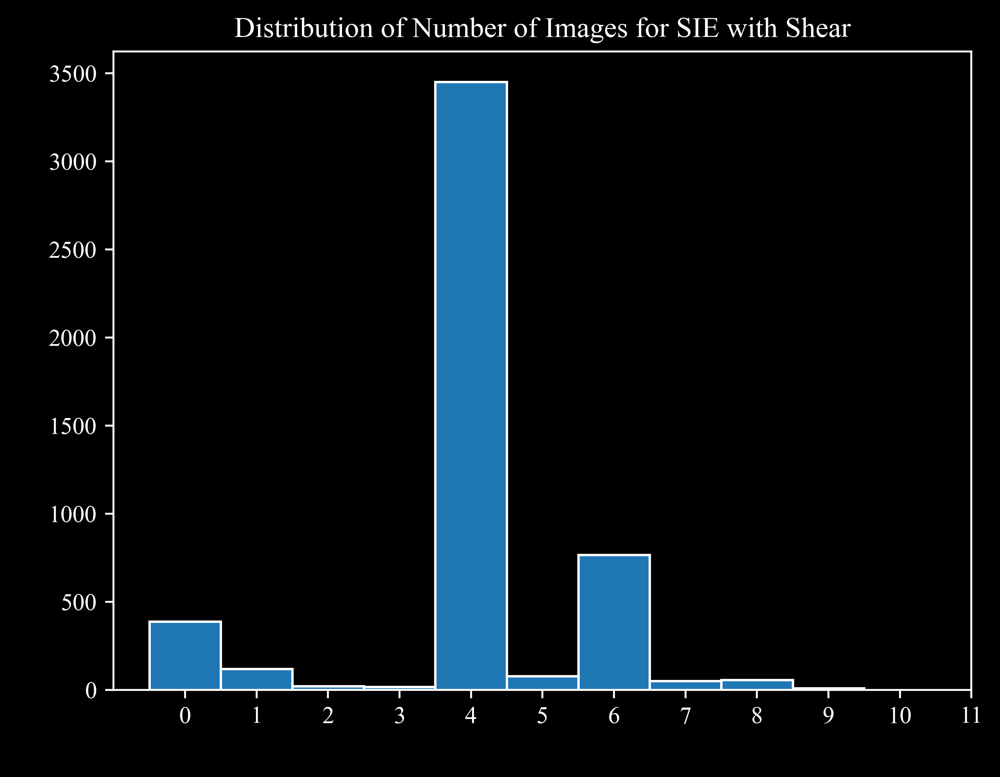

In [17]:
plt.hist(df['num_images'], bins=range(0, 11), align='left', edgecolor='w')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images for SIE with Shear')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11])
plt.show()

In [18]:
mask = df['num_images'] == 4
filtered_df_0 = df[mask]
filtered_df_0 = filtered_df_0.reset_index(drop=True)

# Precentage of 4 image models 
percentage_4_images = (len(filtered_df_0) / len(df)) * 100
print(f"Percentage of 4 image models: {percentage_4_images:.2f}%")

Percentage of 4 image models: 69.04%


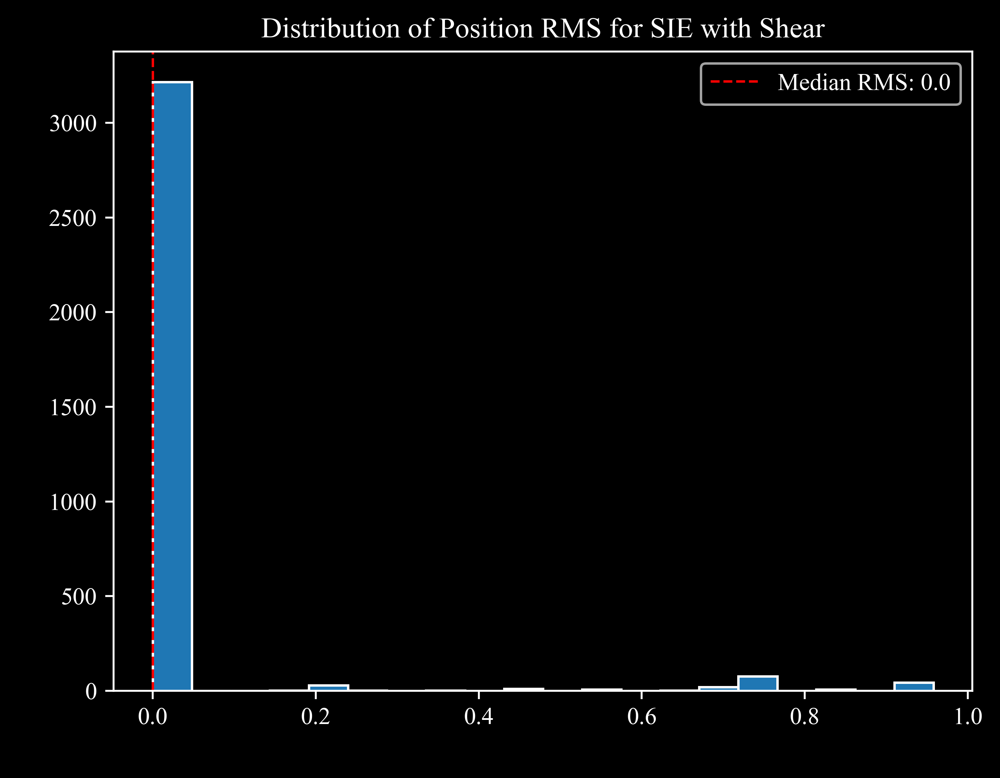

In [19]:
plt.hist(filtered_df_0['pos_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['pos_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['pos_rms'].median(), 4)))
plt.xlabel('Position RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Position RMS for SIE with Shear')
plt.show()

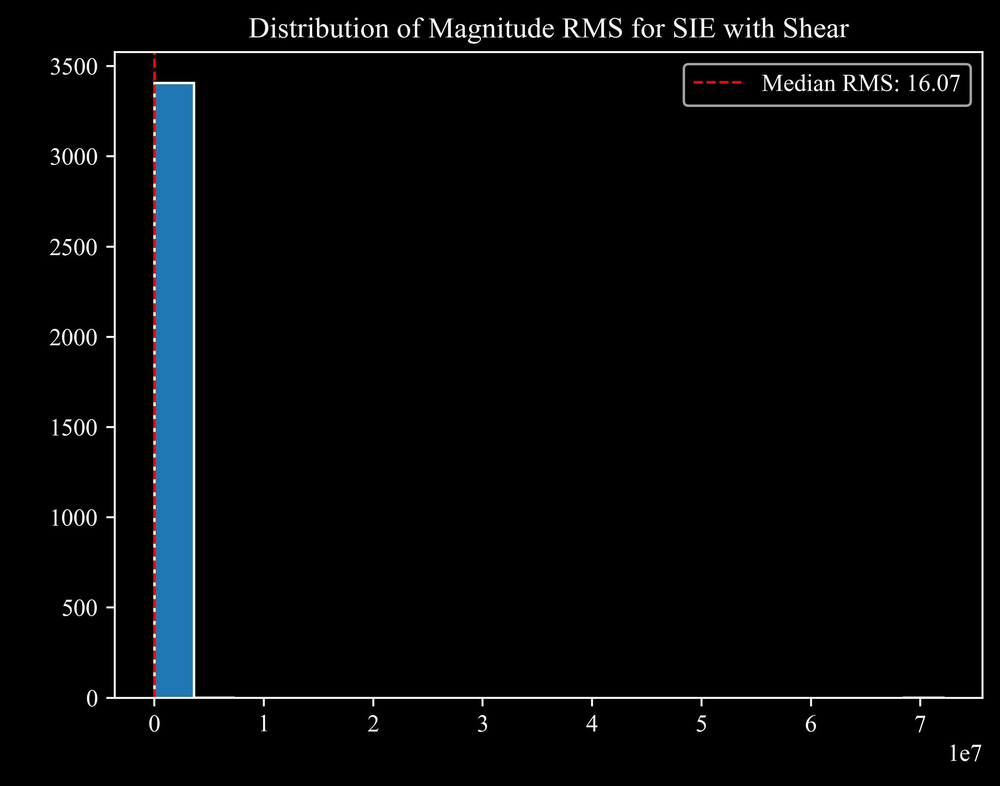

In [20]:
plt.hist(filtered_df_0['mag_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['mag_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['mag_rms'].median(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Magnitude RMS for SIE with Shear')
plt.show()

In [21]:
mask2 = filtered_df_0['pos_rms']  == 3.101229586803652e-05
filtered_df = filtered_df_0[mask2]
filtered_df = filtered_df.reset_index(drop=True)
filtered_df

,strength,pa,kappa,num_images,pos_rms,mag_rms,t_shear_str,t_shear_pa,t_shear_kappa,sie_vel_disp,sie_pa,sie_ell
0,0.01,0.0,-0.5000,4,0.000031,17.042175,0.041708,-31.43810,-0.048379,161.6393,40.11053,0.092213
1,0.01,0.0,-0.3889,4,0.000031,17.009250,0.069070,-26.90683,-0.429578,188.7589,56.35244,0.114194
2,0.01,0.0,-0.2778,4,0.000031,2.186150,0.067188,-31.03161,-0.667160,203.8325,41.46375,0.092502
3,0.01,0.0,-0.0556,4,0.000031,340.766200,0.058385,-15.37979,-0.082628,164.3463,75.00240,0.157300
4,0.01,0.0,0.0556,4,0.000031,54.074200,0.051505,-26.33178,-0.013580,158.9489,58.73395,0.123991
...,...,...,...,...,...,...,...,...,...,...,...,...
2950,0.50,360.0,-0.3889,4,0.000031,1.757125,0.068255,327.31130,-0.779586,210.6015,216.17660,0.092567
2951,0.50,360.0,-0.2778,4,0.000031,1.703425,0.080563,330.10060,-0.922618,218.8895,45.39128,0.094581
2952,0.50,360.0,-0.1667,4,0.000031,4.671450,0.129078,343.59530,-0.830242,213.9254,75.68378,0.231268
2953,0.50,360.0,0.0556,4,0.000031,120.929775,0.071366,332.71270,-0.170952,170.8914,60.85746,0.160504


In [22]:
# Percentage Calc
num_goodfit = len(filtered_df)
num_total = len(df[df['num_images'] == 4])
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits out of 4 image models: {percentage_goodfit:.2f}%")

num_goodfit = len(filtered_df)
num_total = len(df)
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits: {percentage_goodfit:.2f}%")

Percentage of good fits out of 4 image models: 85.60%
Percentage of good fits: 59.10%


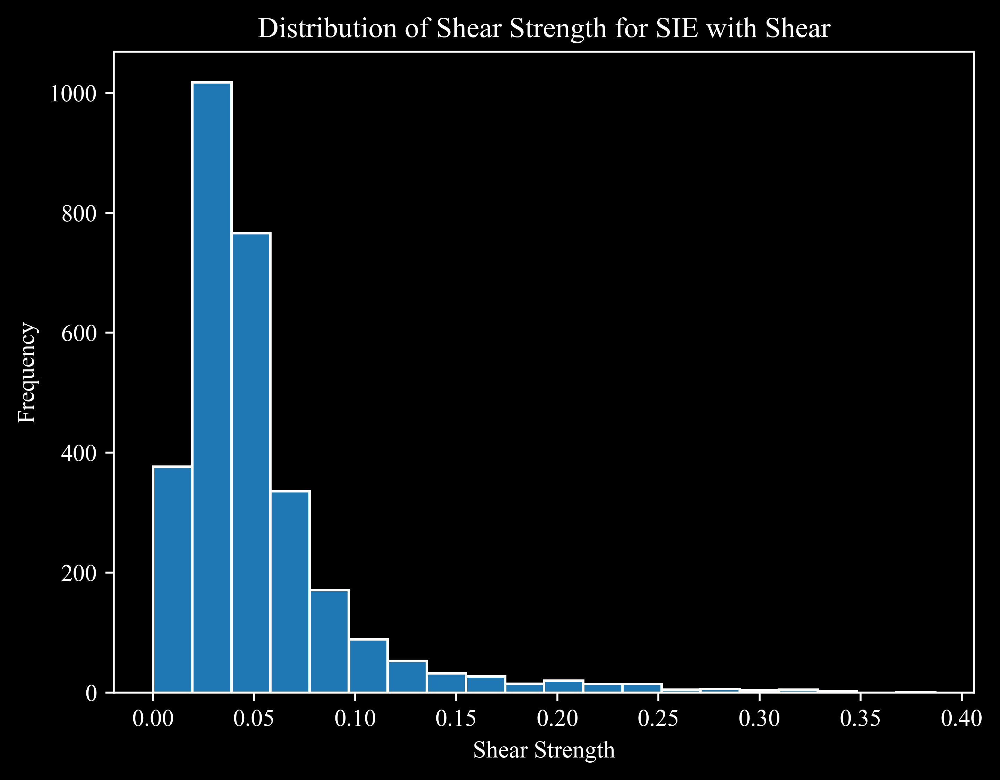

In [23]:
plt.hist(filtered_df['t_shear_str'], bins=20, edgecolor='w')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Strength for SIE with Shear')
plt.show()

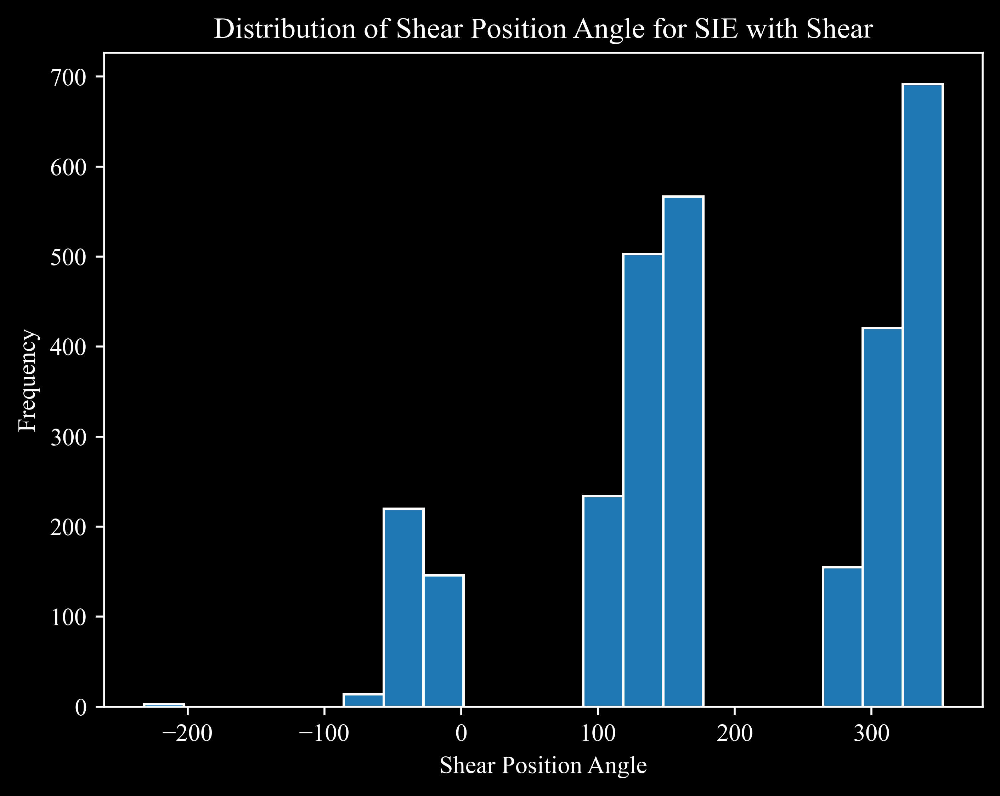

In [24]:
plt.hist(filtered_df['t_shear_pa'], bins=20, edgecolor='w')
plt.xlabel('Shear Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Position Angle for SIE with Shear')
plt.show()

In [25]:
aligned_pa = (filtered_df['t_shear_pa'] > 100) & (filtered_df['t_shear_pa'] < 200)
num_aligned = len(filtered_df[aligned_pa])
print(f"Number of aligned shear position angles: {num_aligned}")
anti_aligned_pa = (filtered_df['t_shear_pa'] < 0) | (filtered_df['t_shear_pa'] > 200)
print(f"Number of anti-aligned shear position angles: {len(filtered_df[anti_aligned_pa])}")

# Percentage
percentage_aligned = (num_aligned / len(filtered_df)) * 100
print(f"Percentage of aligned shear position angles: {percentage_aligned:.2f}%")
percentage_anti_aligned = (len(filtered_df[anti_aligned_pa]) / len(filtered_df)) * 100
print(f"Percentage of anti-aligned shear position angles: {percentage_anti_aligned:.2f}%")

Number of aligned shear position angles: 1264
Number of anti-aligned shear position angles: 1651
Percentage of aligned shear position angles: 42.77%
Percentage of anti-aligned shear position angles: 55.87%


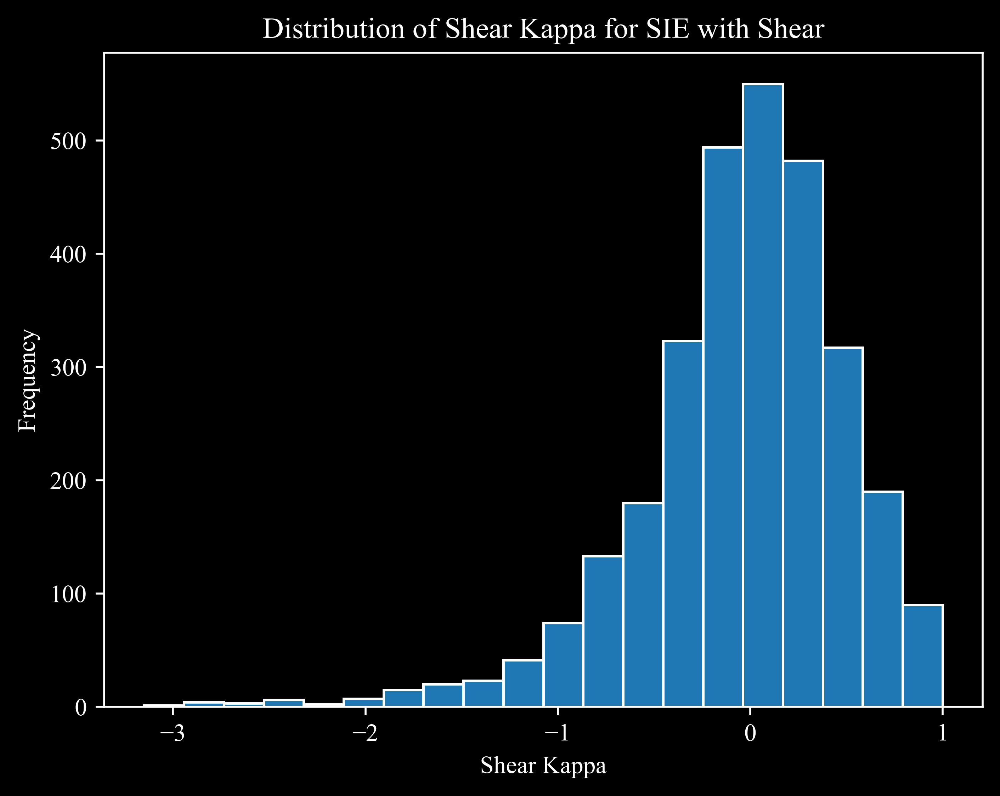

In [26]:
plt.hist(filtered_df['t_shear_kappa'], bins=20, edgecolor='w')
plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Kappa for SIE with Shear')
plt.show()

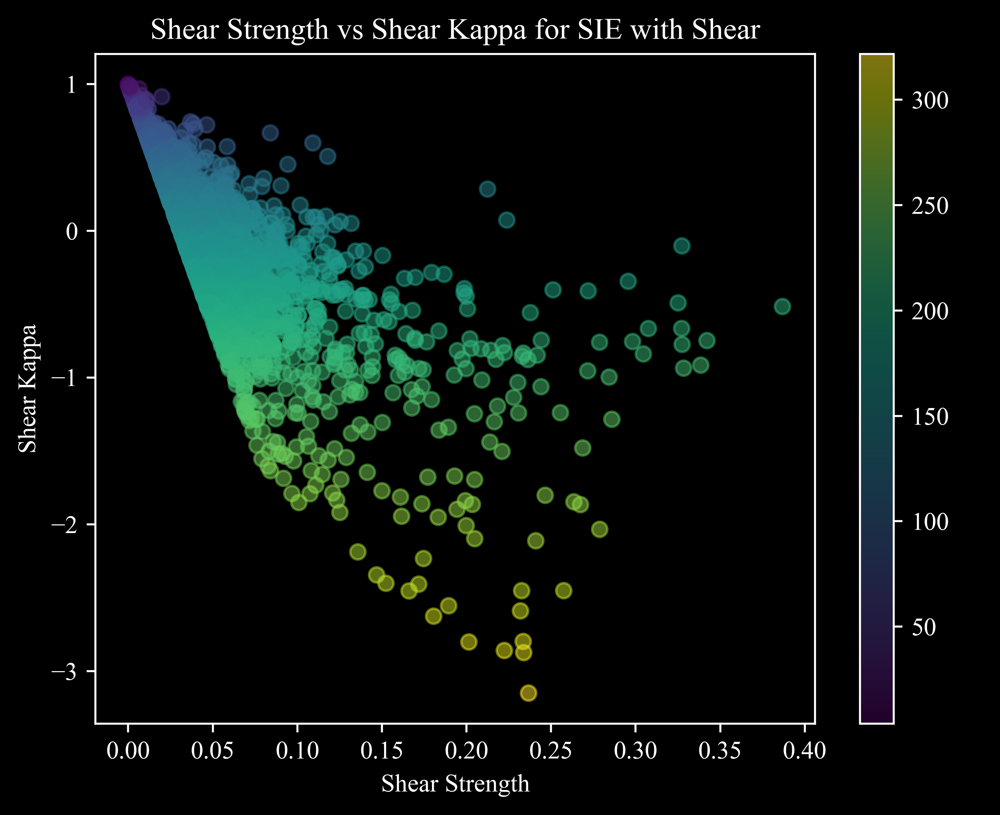

In [54]:
plt.scatter(filtered_df['t_shear_str'], filtered_df['t_shear_kappa'], c=filtered_df['sie_vel_disp'], alpha=0.5)
plt.colorbar(label='SIE Vel Disp')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Shear Kappa', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

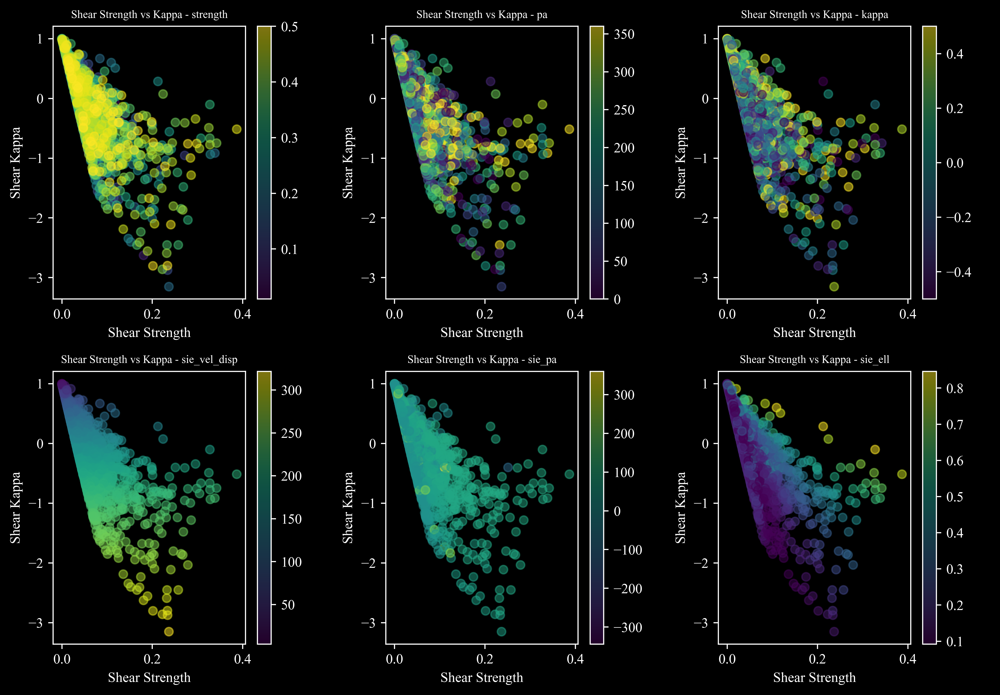

In [69]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 'sie_vel_disp', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_str'], filtered_df['t_shear_kappa'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Strength', color = 'w')
    plt.ylabel('Shear Kappa', color = 'w')
    plt.title(f'Shear Strength vs Kappa - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


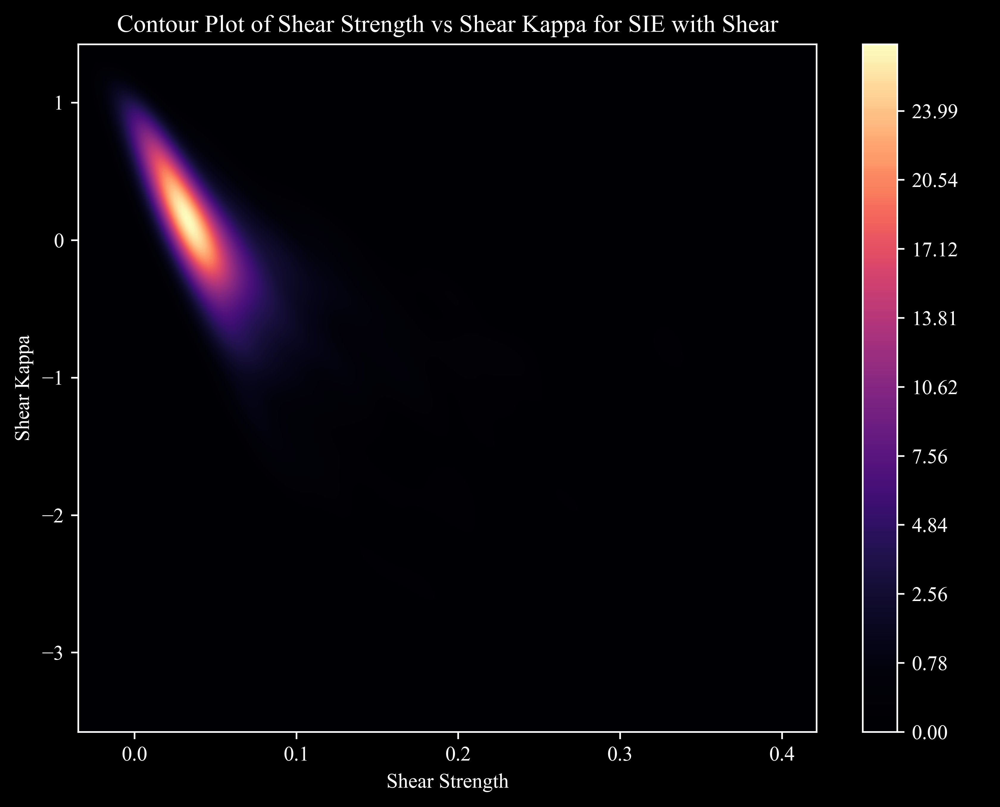

In [50]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(y=filtered_df['t_shear_kappa'], x=filtered_df['t_shear_str'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'})

plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Shear Kappa', color = 'w')
plt.title('Contour Plot of Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

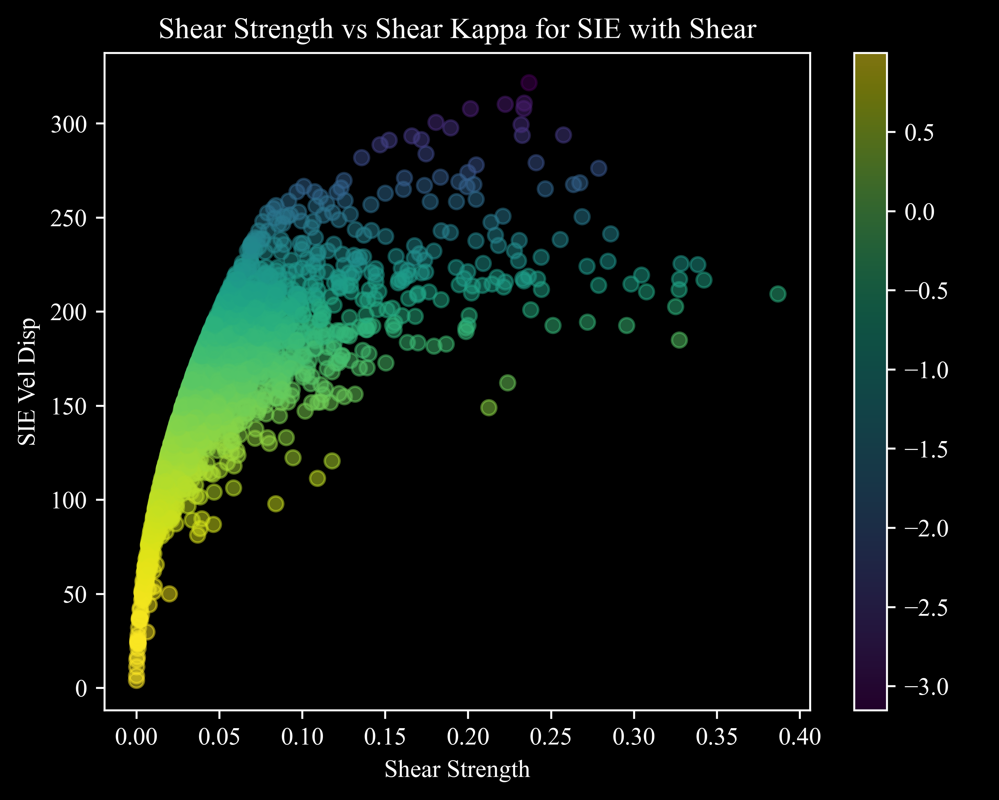

In [53]:
plt.scatter(filtered_df['t_shear_str'], filtered_df['sie_vel_disp'], c=filtered_df['t_shear_kappa'], alpha=0.5)
plt.colorbar(label='Shear Kappa')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('SIE Vel Disp', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.show()

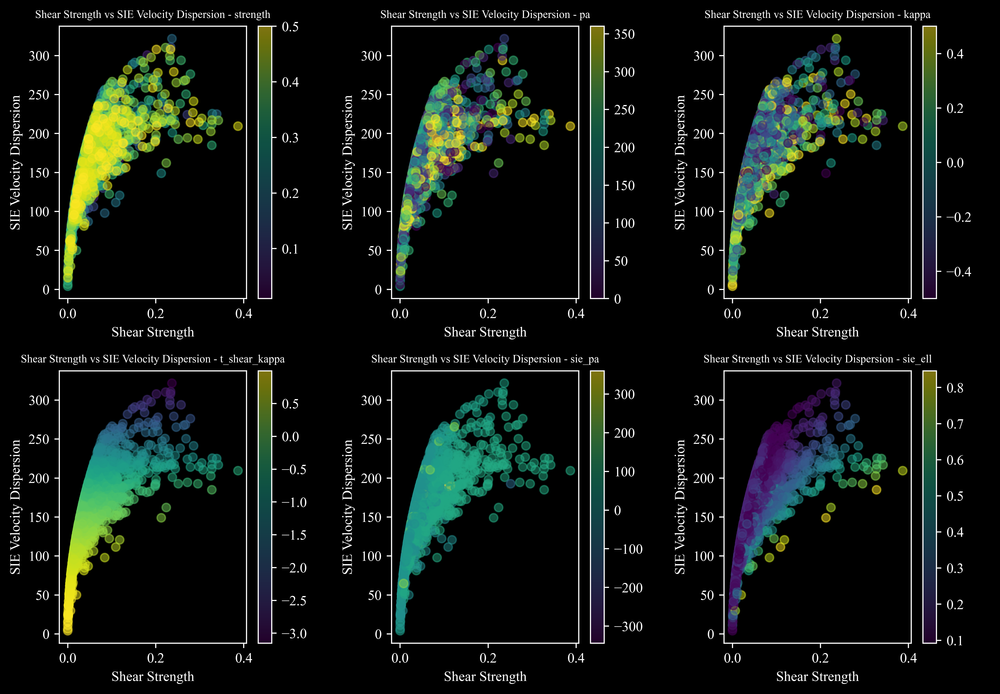

In [71]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 't_shear_kappa', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_str'], filtered_df['sie_vel_disp'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Strength', color = 'w')
    plt.ylabel('SIE Velocity Dispersion', color = 'w')
    plt.title(f'Shear Strength vs SIE Velocity Dispersion - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


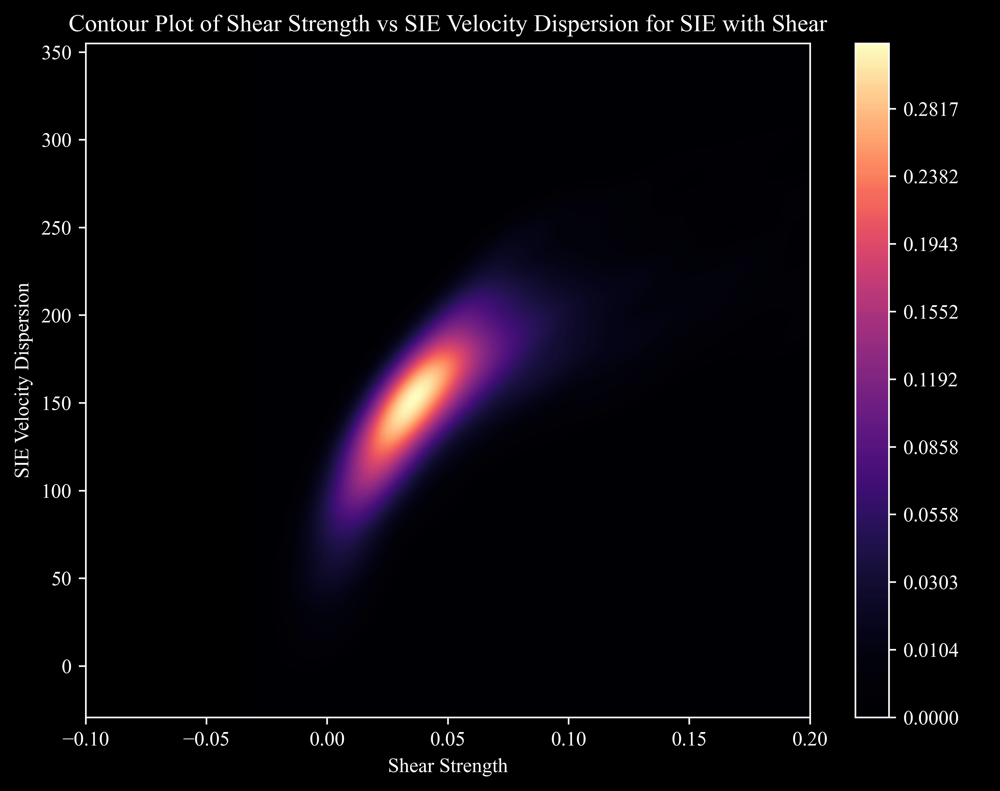

In [45]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(y=filtered_df['sie_vel_disp'], x=filtered_df['t_shear_str'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'})
plt.xlim(-0.1, 0.2)

plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('SIE Velocity Dispersion', color = 'w')
plt.title('Contour Plot of Shear Strength vs SIE Velocity Dispersion for SIE with Shear')
plt.show()

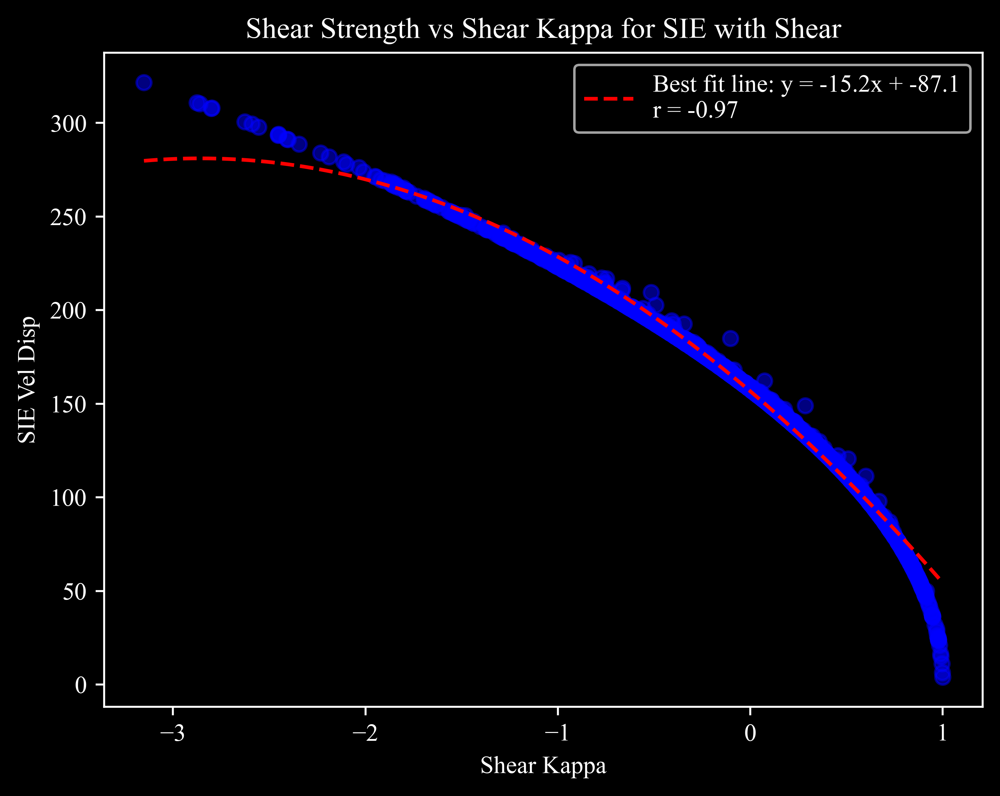

In [51]:
plt.scatter(filtered_df['t_shear_kappa'], filtered_df['sie_vel_disp'], c='blue', alpha=0.5)

# Calculate best fit line
z = np.polyfit(filtered_df['t_shear_kappa'], filtered_df['sie_vel_disp'], 2)
p = np.poly1d(z)

# Calculate correlation coefficient
r = np.corrcoef(filtered_df['t_shear_kappa'], filtered_df['sie_vel_disp'])[0,1]

x_range = np.linspace(filtered_df['t_shear_kappa'].min(), filtered_df['t_shear_kappa'].max(), 100)
plt.plot(x_range, p(x_range), 'r--', 
         label=f'Best fit line: y = {z[0]:.1f}x + {z[1]:.1f}\nr = {r:.2f}')

plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('SIE Vel Disp', color = 'w')
plt.title('Shear Strength vs Shear Kappa for SIE with Shear')
plt.legend()
plt.show()

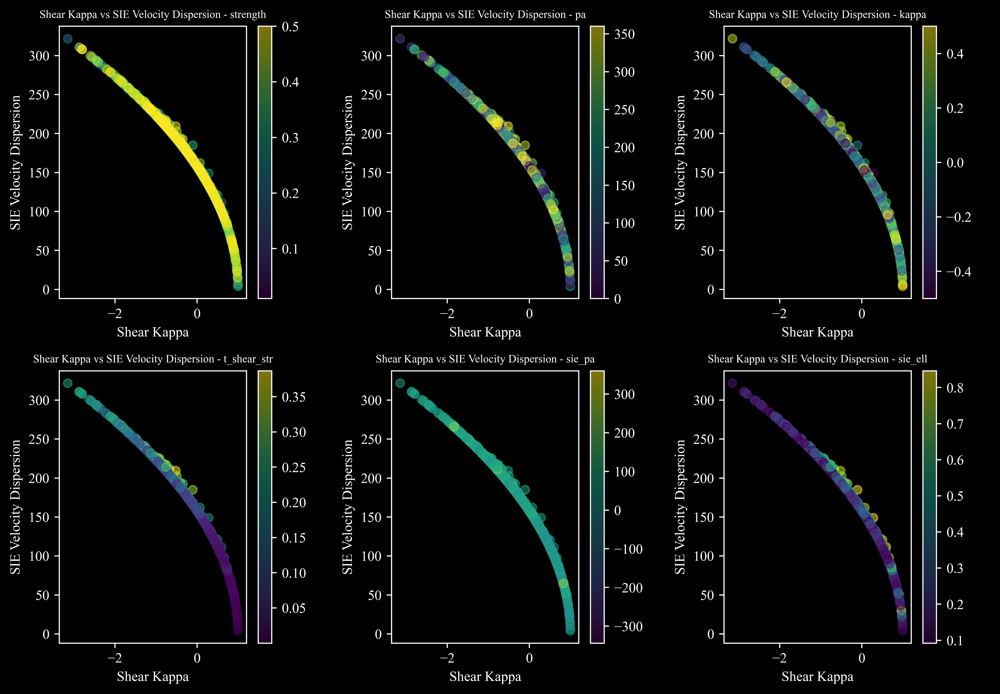

In [72]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 't_shear_str', 'sie_pa', 'sie_ell']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_kappa'], filtered_df['sie_vel_disp'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Kappa', color = 'w')
    plt.ylabel('SIE Velocity Dispersion', color = 'w')
    plt.title(f'Shear Kappa vs SIE Velocity Dispersion - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


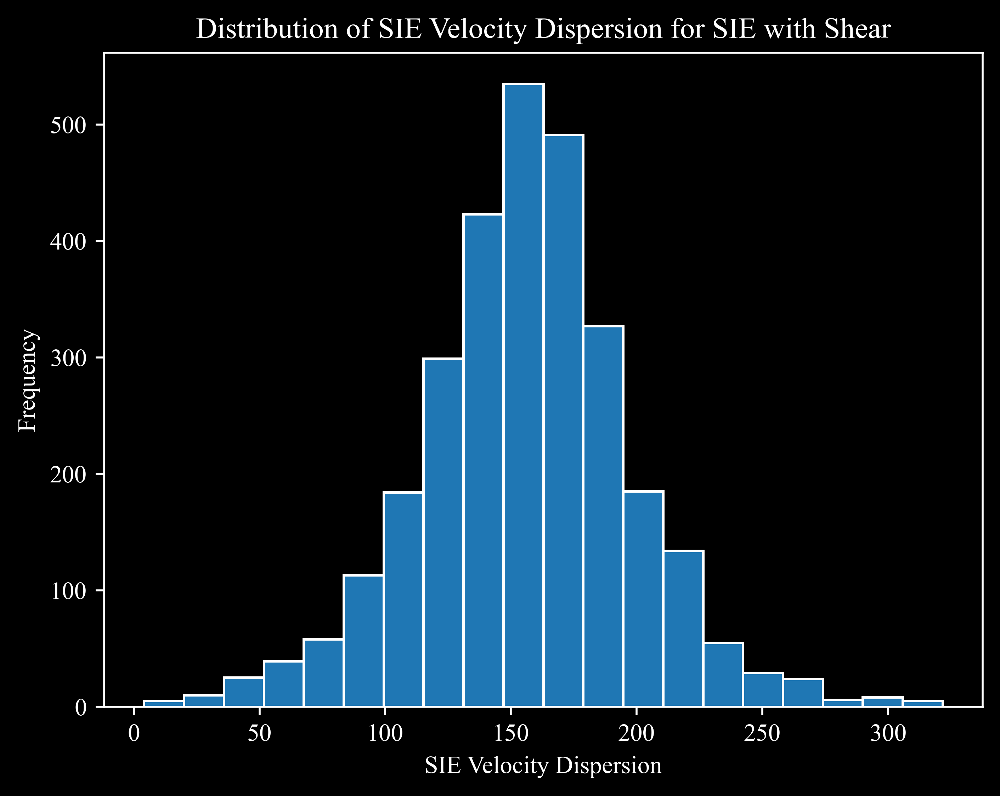

In [30]:
plt.hist(filtered_df['sie_vel_disp'], bins=20, edgecolor='w')
plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Velocity Dispersion for SIE with Shear')
plt.show()

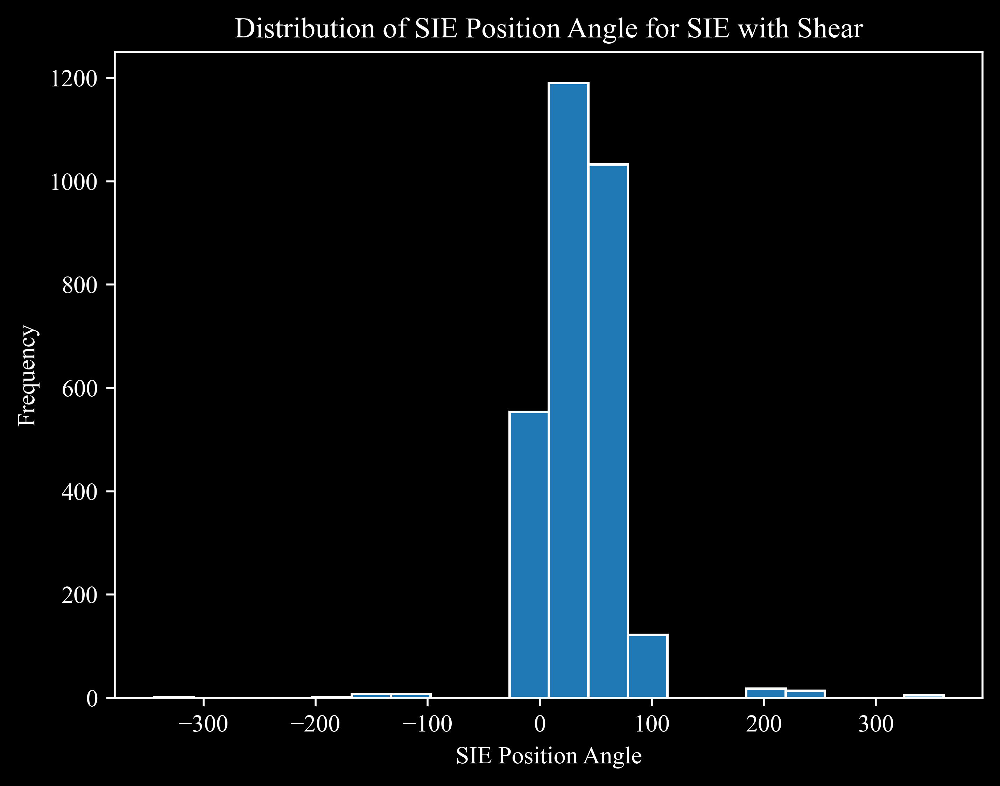

In [31]:
plt.hist(filtered_df['sie_pa'], bins=20, edgecolor='w')
plt.xlabel('SIE Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Position Angle for SIE with Shear')
plt.show()

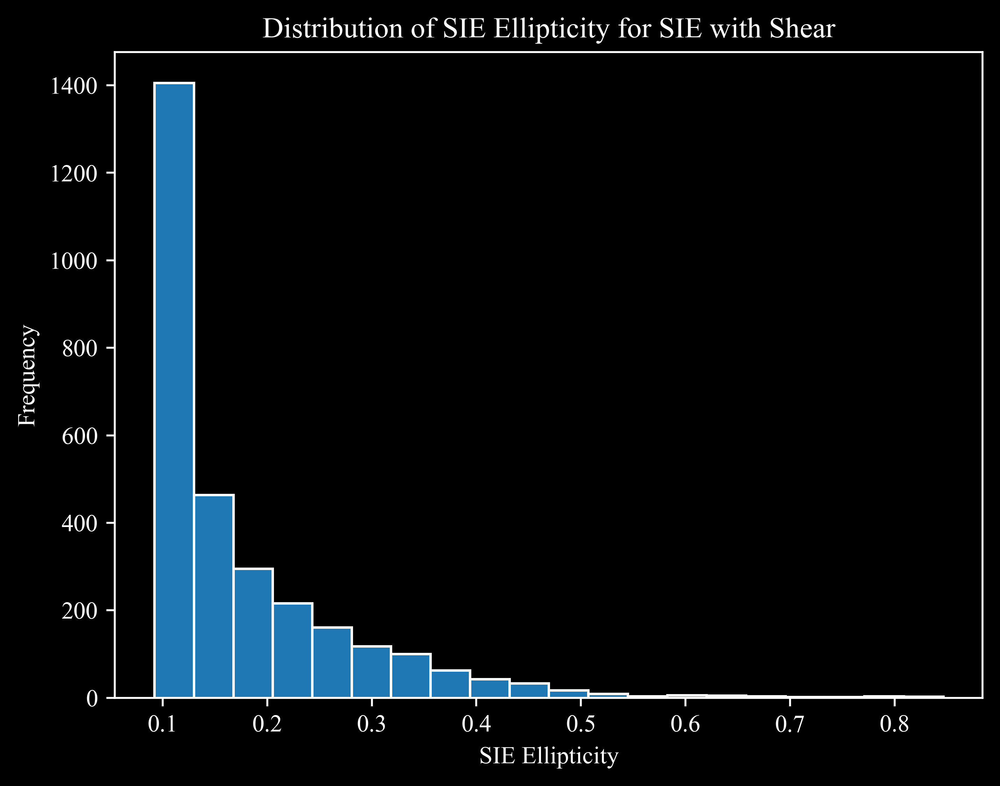

In [32]:
plt.hist(filtered_df['sie_ell'], bins=20, edgecolor='w')
plt.xlabel('SIE Ellipticity', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of SIE Ellipticity for SIE with Shear')
plt.show()

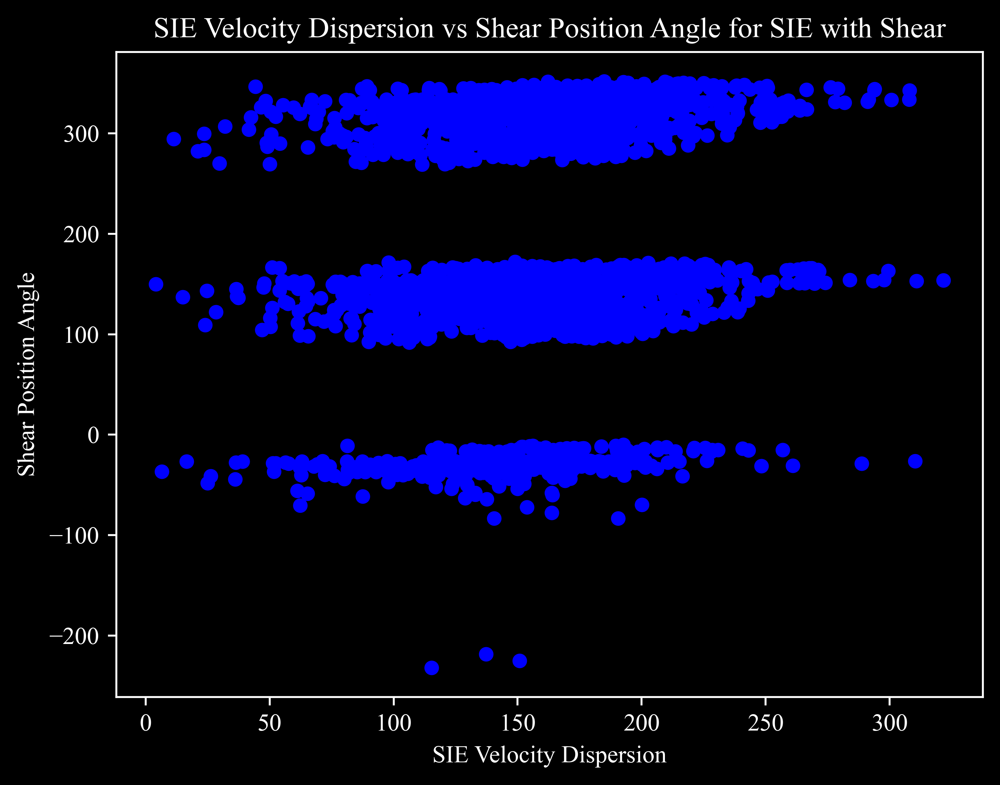

In [33]:
plt.plot(filtered_df['sie_vel_disp'], filtered_df['t_shear_pa'], 'bo', markersize=5, alpha=1)
plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Shear Position Angle', color = 'w')
plt.title('SIE Velocity Dispersion vs Shear Position Angle for SIE with Shear')
plt.show() 

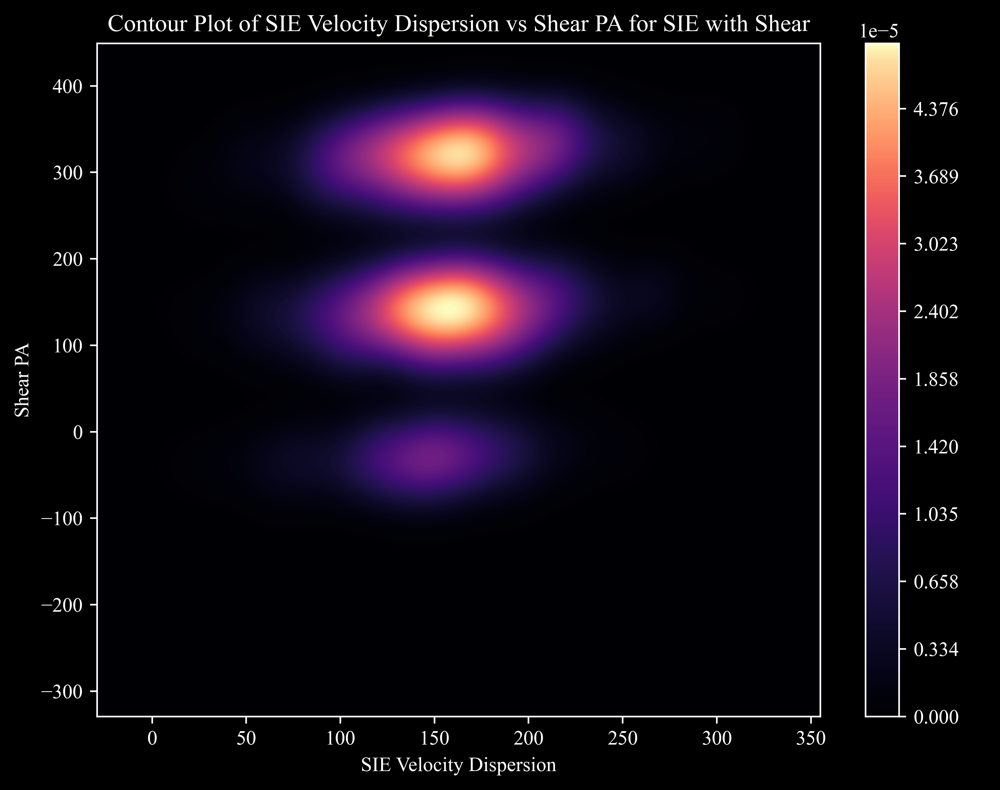

In [34]:
# Contour Plot 
plt.figure(figsize=(8, 6))
sns.kdeplot(x=filtered_df['sie_vel_disp'], y=filtered_df['t_shear_pa'], 
            cmap='magma', fill=True, thresh=0, levels=300, 
            cbar=True, cbar_kws={'label': 'Density'},)

plt.xlabel('SIE Velocity Dispersion', color = 'w')
plt.ylabel('Shear PA', color = 'w')
plt.title('Contour Plot of SIE Velocity Dispersion vs Shear PA for SIE with Shear')
plt.show()

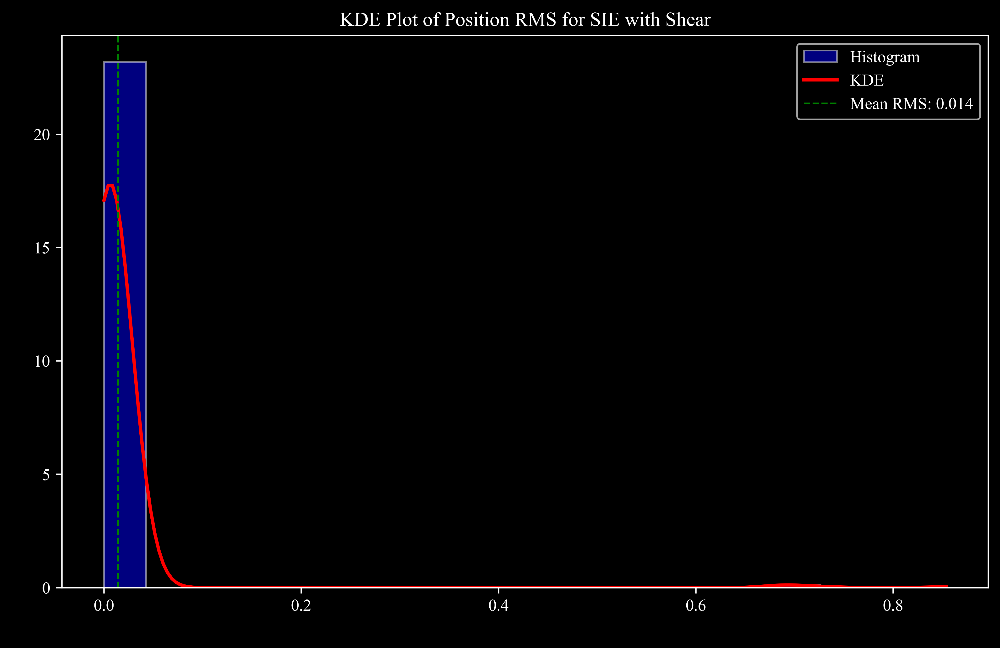

In [24]:
# KDE Plots
# KDE Plot for Position RMS
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df_0['pos_rms'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df_0['pos_rms'])
x_range = np.linspace(filtered_df_0['pos_rms'].min(), filtered_df_0['pos_rms'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')

plt.axvline(filtered_df_0['pos_rms'].mean(), color='green', linestyle='dashed', linewidth=1, 
            label='Mean RMS: ' + str(round(filtered_df_0['pos_rms'].mean(), 4)))

plt.xlabel('Position RMS')
plt.ylabel('Density')
plt.title('KDE Plot of Position RMS for SIE with Shear')
plt.legend()
plt.show()

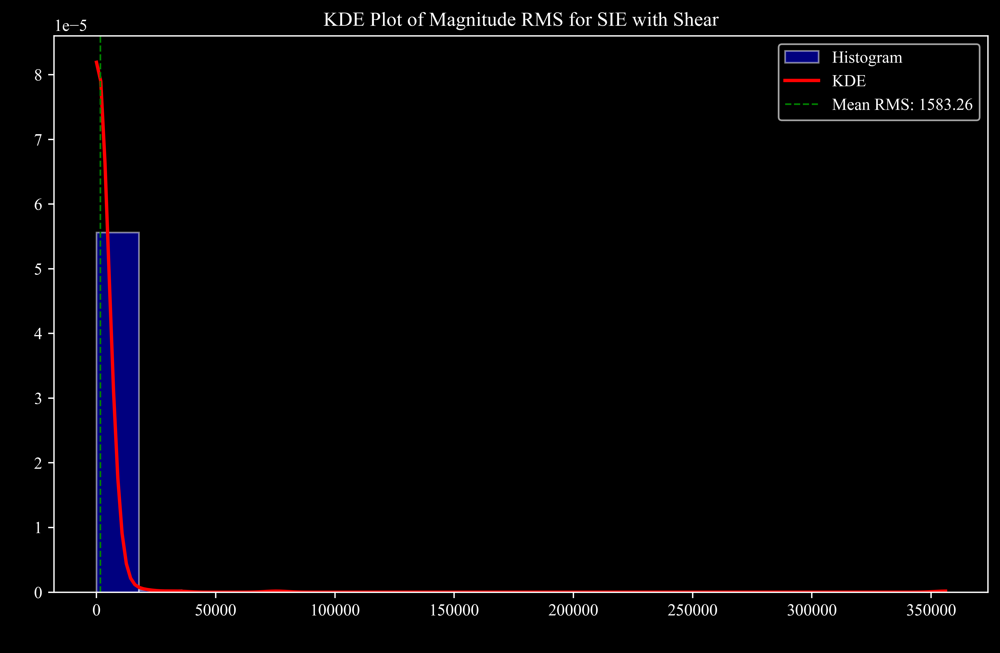

In [25]:
# KDE Plot for Magnitude RMS
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df_0['mag_rms'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df_0['mag_rms'])
x_range = np.linspace(filtered_df_0['mag_rms'].min(), filtered_df_0['mag_rms'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.axvline(filtered_df_0['mag_rms'].mean(), color='green', linestyle='dashed', linewidth=1, 
            label='Mean RMS: ' + str(round(filtered_df_0['mag_rms'].mean(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Density')
plt.title('KDE Plot of Magnitude RMS for SIE with Shear')
plt.legend()
plt.show()

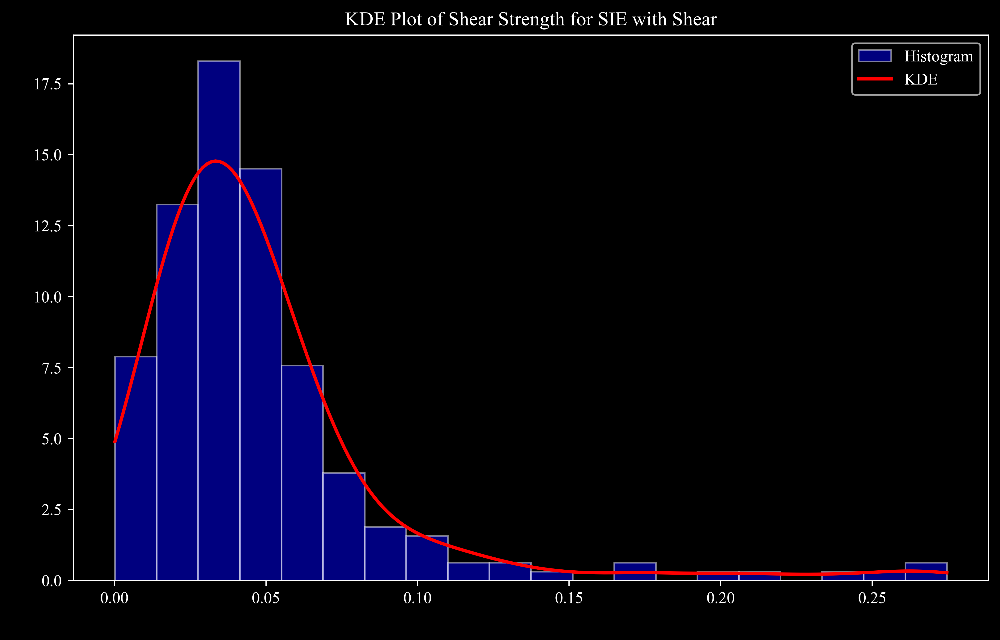

In [26]:
# KDE Plot for Shear Strength
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['t_shear_str'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['t_shear_str'])
x_range = np.linspace(filtered_df['t_shear_str'].min(), filtered_df['t_shear_str'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('Shear Strength')
plt.ylabel('Density')
plt.title('KDE Plot of Shear Strength for SIE with Shear')
plt.legend()
plt.show()

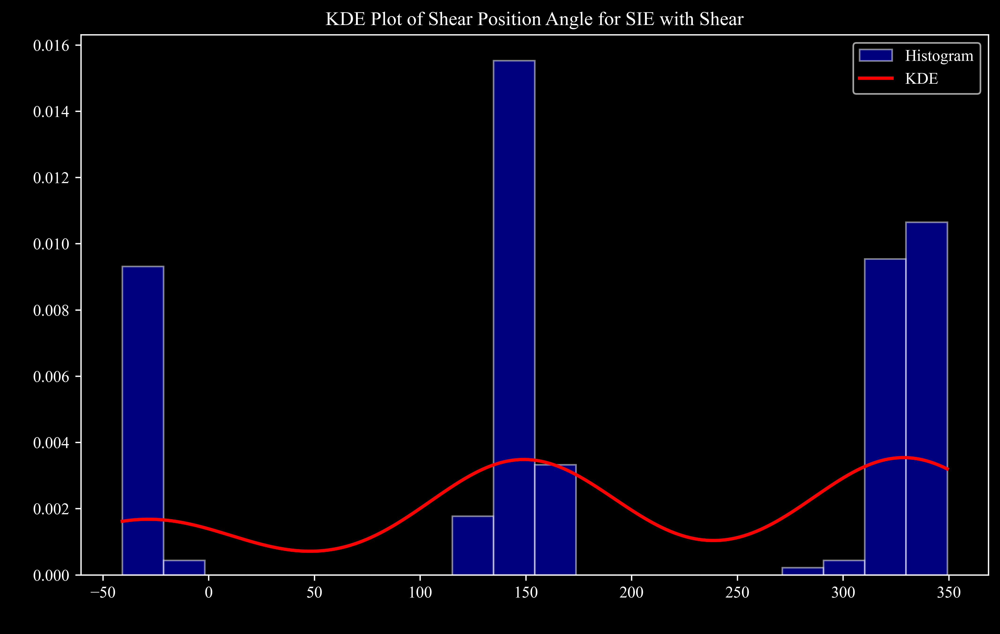

In [27]:
# KDE Plot for Shear PA 
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['t_shear_pa'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')
# KDE fit
kde = gaussian_kde(filtered_df['t_shear_pa'])
x_range = np.linspace(filtered_df['t_shear_pa'].min(), filtered_df['t_shear_pa'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('Shear Position Angle')
plt.ylabel('Density')
plt.title('KDE Plot of Shear Position Angle for SIE with Shear')
plt.legend()
plt.show()

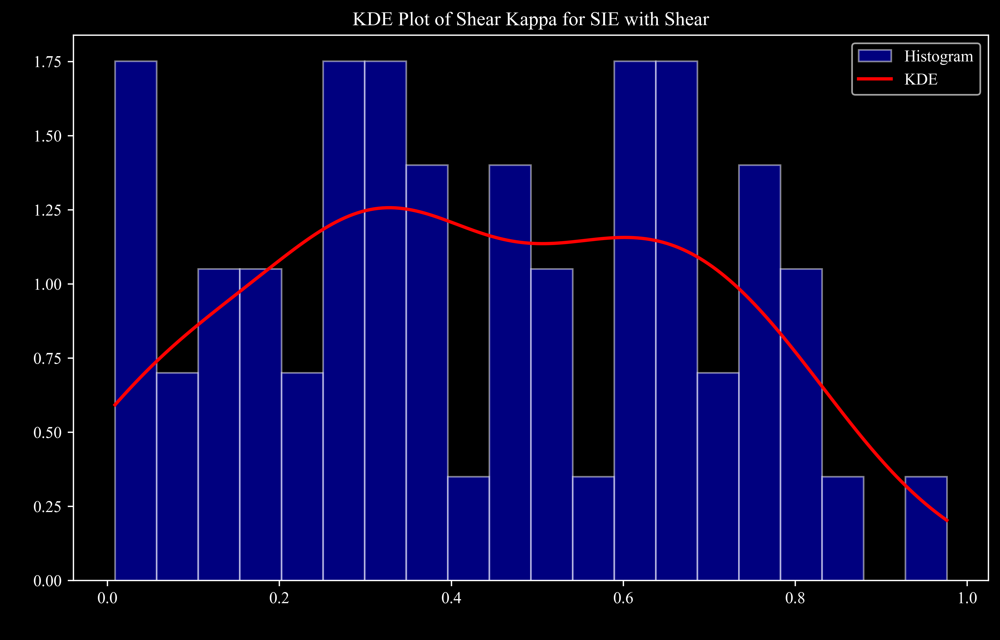

In [48]:
# KDE Plot for Shear Kappa
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['t_shear_kappa'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['t_shear_kappa'])
x_range = np.linspace(filtered_df['t_shear_kappa'].min(), filtered_df['t_shear_kappa'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('Shear Kappa')
plt.ylabel('Density')
plt.title('KDE Plot of Shear Kappa for SIE with Shear')
plt.legend()
plt.show()

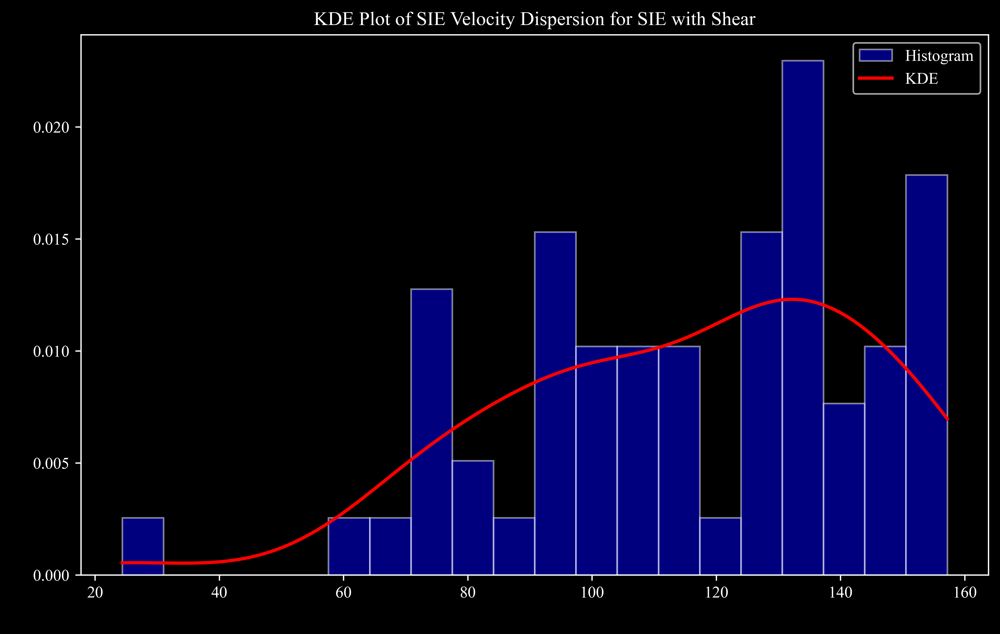

In [49]:
# kDE Plot for SIE Velocity Dispersion
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['sie_vel_disp'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['sie_vel_disp'])
x_range = np.linspace(filtered_df['sie_vel_disp'].min(), filtered_df['sie_vel_disp'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('SIE Velocity Dispersion')
plt.ylabel('Density')
plt.title('KDE Plot of SIE Velocity Dispersion for SIE with Shear')
plt.legend()
plt.show()

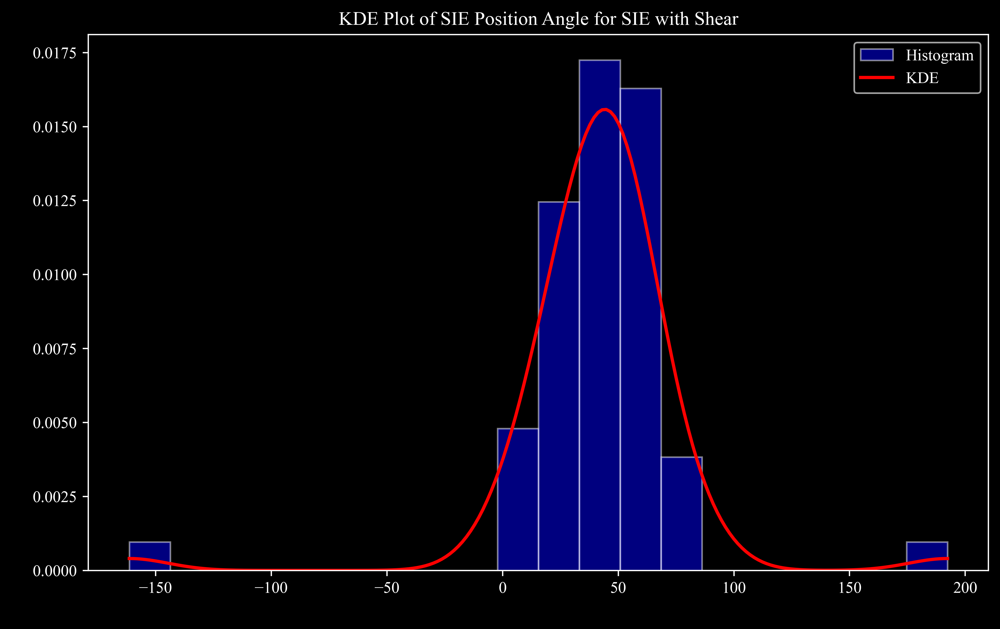

In [50]:
# kDE Plot for SIE PA
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['sie_pa'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['sie_pa'])
x_range = np.linspace(filtered_df['sie_pa'].min(), filtered_df['sie_pa'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('SIE Position Angle')
plt.ylabel('Density')
plt.title('KDE Plot of SIE Position Angle for SIE with Shear')
plt.legend()
plt.show()

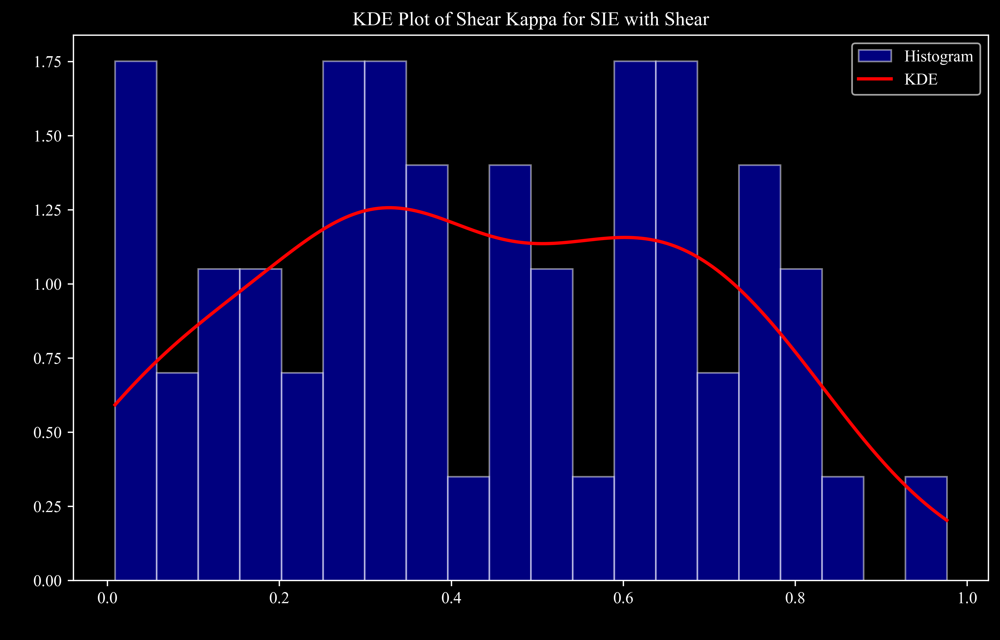

In [51]:
# KDE Plot for Shear Kappa
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['t_shear_kappa'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['t_shear_kappa'])
x_range = np.linspace(filtered_df['t_shear_kappa'].min(), filtered_df['t_shear_kappa'].max(), 200)
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='KDE')
plt.xlabel('Shear Kappa')
plt.ylabel('Density')
plt.title('KDE Plot of Shear Kappa for SIE with Shear')
plt.legend()
plt.show()

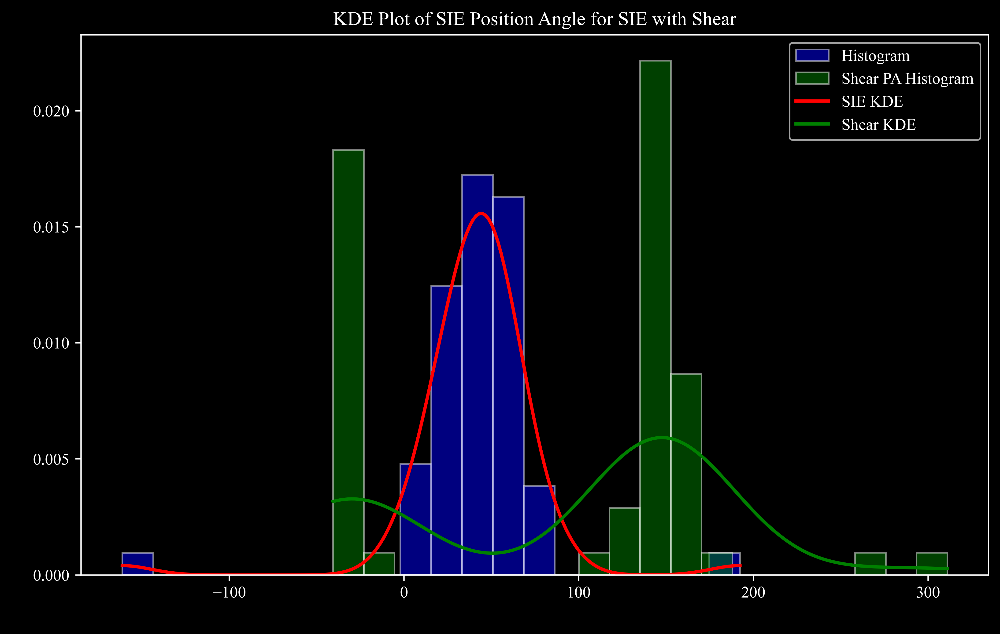

In [52]:
# kDE Plot for SIE PA
plt.figure(figsize=(10, 6))

# Histogram
plt.hist(filtered_df['sie_pa'], bins=20, density=True, alpha=0.5, color='blue', edgecolor='w', label='Histogram')
plt.hist(filtered_df['t_shear_pa'], bins=20, density=True, alpha=0.5, color='green', edgecolor='w', label='Shear PA Histogram')

# KDE fit
kde = gaussian_kde(filtered_df['sie_pa'])
x_range = np.linspace(filtered_df['sie_pa'].min(), filtered_df['sie_pa'].max(), 200)
x_range_shear = np.linspace(filtered_df['t_shear_pa'].min(), filtered_df['t_shear_pa'].max(), 200)
kde_shear = gaussian_kde(filtered_df['t_shear_pa'])
plt.plot(x_range, kde(x_range), 'r-', lw=2, label='SIE KDE')
plt.plot(x_range_shear, kde_shear(x_range_shear), 'g-', lw=2, label='Shear KDE')
plt.xlabel('SIE Position Angle')
plt.ylabel('Density')
plt.title('KDE Plot of SIE Position Angle for SIE with Shear')
plt.legend()
plt.show()